### import library

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression  
from sklearn.ensemble import RandomForestRegressor 
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR  
import lightgbm as lgb 
from xgboost import XGBRFRegressor

from sklearn.model_selection import train_test_split 
from sklearn.metrics import mean_squared_error 

from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
import warnings
warnings.filterwarnings('ignore')

In [2]:
all_data = pd.read_csv('./processed_data.csv')

cond = all_data['label'] == 'train'
train_data = all_data[cond]
train_data.drop(labels = 'label',axis = 1,inplace = True)
X_train,X_valid,y_train,y_valid=train_test_split(train_data.drop(labels='target',axis = 1),
                                                 train_data['target'],
                                                 test_size=0.2)
cond2 = all_data['label'] == 'test'
test_data = all_data[cond2]
test_data.drop(labels = ['label','target'],axis = 1,inplace = True)

In [3]:
all_data

,V0,V1,V2,V3,V4,V6,V7,V8,V10,V12,...,V24,V27,V29,V30,V31,V35,V36,V37,target,label
0,0.566,0.016,-0.143,0.407,0.452,-1.812,-2.360,-0.436,-0.940,-0.073,...,0.800,0.168,0.136,0.109,-0.615,-5.101,-2.608,-3.508,0.175,train
1,0.968,0.437,0.066,0.566,0.194,-1.566,-2.360,0.332,0.188,-0.134,...,0.801,0.338,-0.128,0.124,0.032,0.364,-0.335,-0.730,0.676,train
2,1.013,0.568,0.235,0.370,0.112,-1.367,-2.360,0.396,0.874,-0.072,...,0.961,0.326,-0.009,0.361,0.277,0.364,0.765,-0.589,0.633,train
3,0.733,0.368,0.283,0.165,0.599,-1.200,-2.086,0.403,0.011,-0.014,...,1.435,0.277,0.015,0.417,0.279,0.364,0.333,-0.112,0.206,train
4,0.684,0.638,0.260,0.209,0.337,-1.073,-2.086,0.314,-0.251,0.199,...,0.881,0.332,0.183,1.078,0.328,0.364,-0.280,-0.028,0.384,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4808,-1.362,-1.553,-3.096,-0.444,0.381,-4.854,-5.331,-4.074,-2.551,0.396,...,-0.630,-1.674,0.171,-4.488,-5.793,-2.131,-2.564,0.597,NaN,test
4809,-2.698,-3.452,-3.620,-1.066,-1.385,-4.927,-5.103,-4.393,-2.525,-1.786,...,-0.204,-1.773,1.297,-0.613,-7.698,-2.131,-2.564,1.215,NaN,test
4810,-2.615,-3.564,-3.402,-0.422,-1.272,-4.223,-4.315,-5.196,-2.529,-1.151,...,1.057,-1.585,0.552,0.125,-6.111,-1.537,-2.544,1.612,NaN,test
4811,-2.661,-3.646,-3.271,-0.699,-1.270,-3.716,-3.809,-4.735,-2.560,-1.512,...,0.800,-1.410,0.318,1.086,-5.268,-1.537,-2.549,1.431,NaN,test


In [4]:
train_data_pca = np.load('./train_data_pca.npz')['X_train']
target_data_pca = np.load('./train_data_pca.npz')['y_train']

X_train_pca,X_valid_pca,y_train_pca,y_valid_pca=train_test_split(train_data_pca,target_data_pca,
                                                               test_size=0.2)
test_data_pca = np.load('./test_data_pca.npz')['X_test']

In [5]:
train_data_pca.shape

(2790, 22)

In [6]:
train_sizes=np.array([0.1  , 0.325, 0.55 , 0.775, 1.   ])
train_sizes

array([0.1  , 0.325, 0.55 , 0.775, 1.   ])

In [7]:
np.floor(X_train_pca.shape[0] * train_sizes * 0.75)

array([ 167.,  544.,  920., 1297., 1674.])

In [8]:
def plot_learning_curve(model,title,X,y,cv=None):
    
    train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=cv)
    print(train_sizes,train_scores.shape,test_scores.shape)
    
    # calculate the mean value and the standard deviation
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,color="r")
    
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.grid() 
    plt.legend(loc="best") 
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Score")

### linear regression

In [9]:
clf = LinearRegression()
clf.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, clf.predict(X_valid_pca))
print("LinearRegression:   ", score)

LinearRegression:    0.1049350919787557


In [10]:
clf = LinearRegression()
clf.fit(X_train, y_train)
score = mean_squared_error(y_valid, clf.predict(X_valid))
print("LinearRegression:   ", score)

LinearRegression:    0.1390565698527749


#### plot_learning_curve

learning curve shows the validation and training score of an estimator for varying numbers of training samples. It is a tool to find out how much we benefit from adding more training data and whether the estimator suffers more from a variance error or a bias error.
overfitting: high variance
underfitting: high bias

[ 167  544  920 1297 1674] (5, 100) (5, 100)


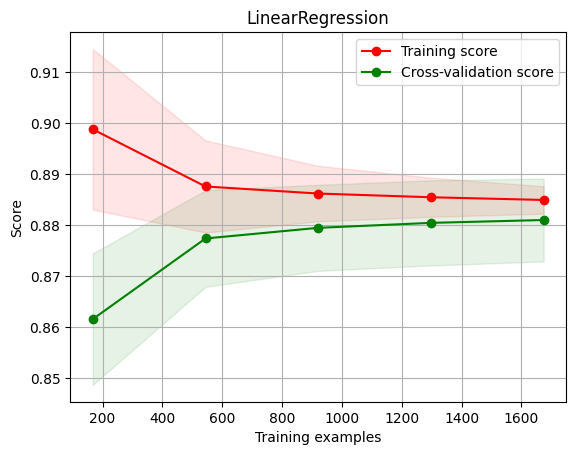

In [11]:
X = X_train_pca
y = y_train_pca
title = "LinearRegression"

cv = ShuffleSplit(n_splits=100, test_size=0.25)

estimator = LinearRegression()    

plot_learning_curve(estimator, title, X, y, cv = cv)


[ 115  375  635  895 1155] (5, 100) (5, 100)


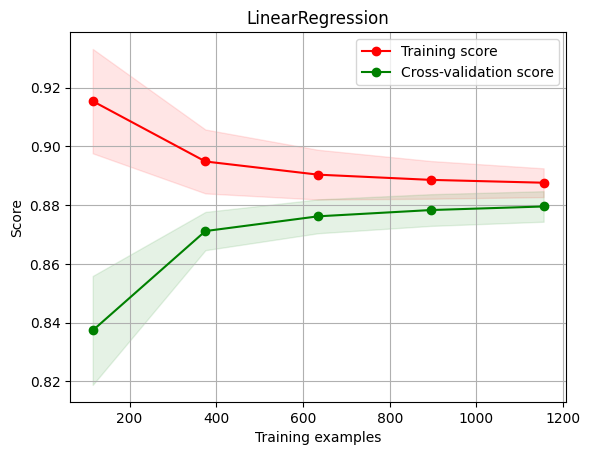

In [12]:
X = X_train
y = y_train
title = "LinearRegression"
cv = ShuffleSplit(n_splits=100, test_size=0.5)
estimator = LinearRegression()    
plot_learning_curve(estimator, title, X, y, cv = cv)

In [13]:
model = LinearRegression()
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./liner_regression_model_predict(pca).txt',y_)

array([ 0.1900706 ,  0.24559791, -0.1507814 , ..., -2.46532551,
       -2.5159793 , -2.22523231])

In [14]:
model = LinearRegression()
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./liner_regression_model_predict(non_pca).txt',y_)

array([ 0.20332878,  0.20637662, -0.11236341, ..., -3.65634214,
       -3.61105651, -2.77820407])

### random forest

In [15]:
model = RandomForestRegressor(n_estimators=200, 
                            max_depth= 10,
                            min_samples_leaf=10,
                            min_samples_split=40,
                            criterion='squared_error')
model.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, model.predict(X_valid_pca))
print("random forest:   ", score)

random forest:    0.13078093649524686


In [16]:
model = RandomForestRegressor(n_estimators=200, 
                            max_depth= 10,
                            min_samples_leaf=10,
                            min_samples_split=40,
                            criterion='squared_error')
model.fit(X_train, y_train)
score = mean_squared_error(y_valid, model.predict(X_valid))
print("random forest:   ", score)

random forest:    0.14917520540140428


In [17]:
model =  RandomForestRegressor(n_estimators=200,
                            max_depth= 10,
                            min_samples_leaf=10,
                            min_samples_split=40,
                            criterion='squared_error')
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./random_forest_model_predict(pca).txt',y_)

array([ 0.3079802 ,  0.22223775, -0.16699145, ..., -2.38670832,
       -2.4141781 , -2.30783145])

In [18]:
model = RandomForestRegressor(n_estimators=200,
                            max_depth= 10,
                            min_samples_leaf=10,
                            min_samples_split=40,
                            criterion='squared_error')
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./random_forest_model_predict(non_pca).txt',y_)

array([ 0.29873292,  0.19370473, -0.06525352, ..., -2.70063516,
       -2.6989486 , -2.67994814])

### SVR

In [19]:
model = SVR(kernel='rbf',C = 1,gamma=0.01,tol = 0.0001,epsilon=0.3)
model.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, model.predict(X_valid_pca))
print("SVR support vector machine:   ", score)

SVR support vector machine:    0.09620829621573894


In [20]:
model = SVR(kernel='rbf')
model.fit(X_train, y_train)
score = mean_squared_error(y_valid, model.predict(X_valid))
print("SVR support vector machine:   ", score)

SVR support vector machine:    0.1617577637544391


[ 111  362  613  864 1116] (5, 100) (5, 100)


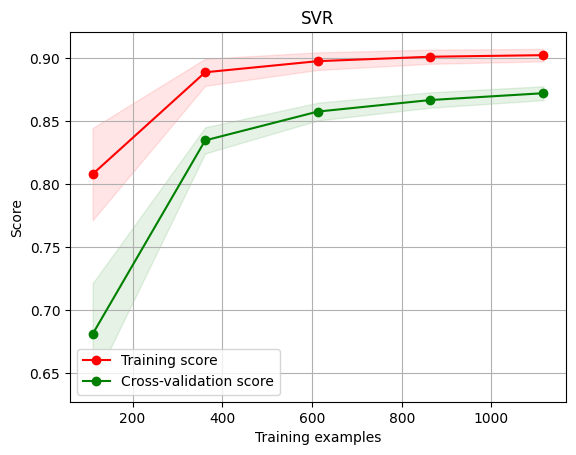

In [21]:
X = X_train_pca
y = y_train_pca
title = "SVR"
cv = ShuffleSplit(n_splits=100, test_size=0.5)
model = SVR(kernel='rbf',C = 1,gamma=0.01,tol = 0.0001,epsilon=0.3)
plot_learning_curve(model, title, X, y, cv = cv)

[ 115  375  635  895 1155] (5, 100) (5, 100)


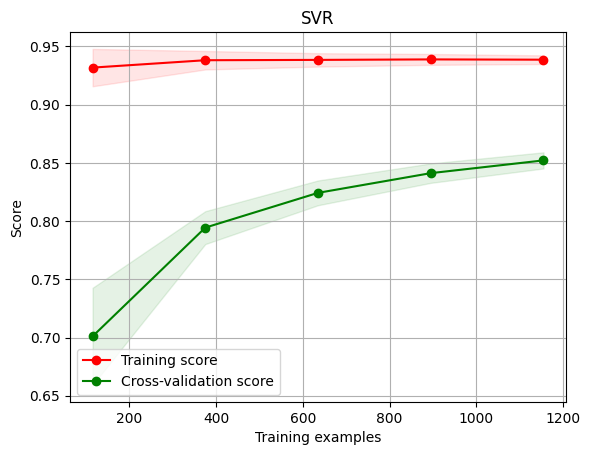

In [22]:
X = X_train
y = y_train
title = "SVR"
cv = ShuffleSplit(n_splits=100, test_size=0.5)
model = SVR(kernel='rbf')
plot_learning_curve(model, title, X, y, cv = cv)

In [23]:
model =  SVR(kernel='rbf',C = 1,gamma=0.01,tol = 0.0001,epsilon=0.3)
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./SVR_model_predict(pca).txt',y_)

array([ 0.2665878 ,  0.25774943, -0.09110797, ..., -2.21395763,
       -2.31255199, -2.16525396])

In [24]:
model =SVR(kernel='rbf')
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./SVR_model_predict(non_pca).txt',y_)

array([ 0.33662803,  0.29804939, -0.0623872 , ..., -1.43261543,
       -1.77611468, -1.84656871])

In [25]:
model =  SVR(kernel='poly')
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./SVR-poly_model_predict(pca).txt',y_)

array([ 0.19450864,  0.27023144,  0.15075083, ..., -4.68651739,
       -3.87777812, -2.84886579])

In [26]:
model =SVR(kernel='poly')
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./SVR-poly_model_predict(non_pca).txt',y_)

array([  0.26404544,   0.21617234,   0.1076031 , ..., -16.04116061,
       -11.52069881,  -5.43838216])

### GBDT

In [27]:
model = GradientBoostingRegressor(learning_rate=0.03, 
                                loss='huber',  
                                max_depth=14, 
                                max_features='sqrt',
                                min_samples_leaf=10,
                                min_samples_split=40,
                                n_estimators=300,
                                subsample=0.8)
model.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, model.predict(X_valid_pca))
print("GBDT score:   ", score)

GBDT score:    0.10633047458533222


In [28]:
model = GradientBoostingRegressor(learning_rate=0.03, 
                                loss='huber',  
                                max_depth=14, 
                                max_features='sqrt',
                                min_samples_leaf=10,
                                min_samples_split=40,
                                n_estimators=300,
                                subsample=0.8)
model.fit(X_train, y_train)
score = mean_squared_error(y_valid, model.predict(X_valid))
print("GBDT score:   ", score)

GBDT score:    0.13511375614368054


[ 111  362  613  864 1116] (5, 100) (5, 100)


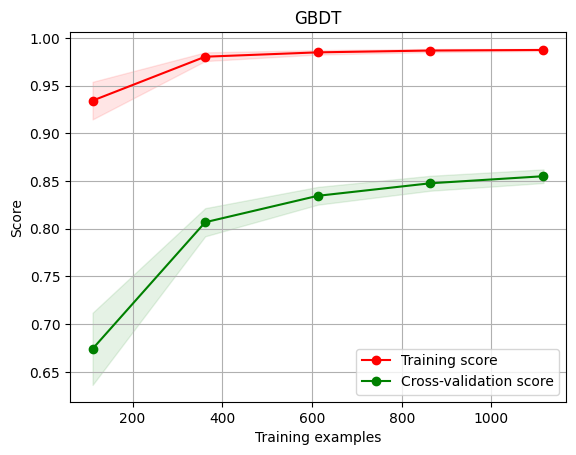

In [29]:
X = X_train_pca
y = y_train_pca
title = "GBDT"
cv = ShuffleSplit(n_splits=100, test_size=0.5)
model = GradientBoostingRegressor(learning_rate=0.03, 
                                loss='huber', 
                                max_depth=14, 
                                max_features='sqrt',
                                min_samples_leaf=10,
                                min_samples_split=40,
                                n_estimators=300,
                                subsample=0.8)
plot_learning_curve(model, title, X, y, cv = cv)

In [30]:

model =  GradientBoostingRegressor(learning_rate=0.03, 
                                loss='huber',  
                                max_depth=14, 
                                max_features='sqrt',
                                min_samples_leaf=10,
                                min_samples_split=40,
                                n_estimators=300,
                                subsample=0.8)
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./GBDT_model_predict(pca).txt',y_)

array([ 0.4075707 ,  0.21598222,  0.1015093 , ..., -1.71997452,
       -1.69756072, -1.83110504])

In [31]:
model = GradientBoostingRegressor(learning_rate=0.03, 
                                loss='huber', 
                                max_depth=14,
                                max_features='sqrt',
                                min_samples_leaf=10,
                                min_samples_split=40,
                                n_estimators=300,
                                subsample=0.8)
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./GBDT_model_predict(non_pca).txt',y_)

array([ 0.44722846,  0.33061252, -0.03024581, ..., -2.52008181,
       -2.72438374, -2.50640394])

### lightGBM

In [32]:
model = lgb.LGBMRegressor(learning_rate=0.05, 
                        n_estimators=300,
                        min_child_samples=10,
                        max_depth=5, 
                        num_leaves = 25,
                        colsample_bytree =0.8,
                        subsample=0.8,
                        reg_alpha = 0.5,
                        reg_lambda = 0.1 )
model.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, model.predict(X_valid_pca))
print("LGB score:   ", score)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5610
[LightGBM] [Info] Number of data points in the train set: 2232, number of used features: 22
[LightGBM] [Info] Start training from score 0.143742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

In [33]:
model = lgb.LGBMRegressor(learning_rate=0.05, 
                        n_estimators=300,
                        min_child_samples=10,
                        max_depth=5, 
                        num_leaves = 25,
                        colsample_bytree =0.8,
                        subsample=0.8,
                        reg_alpha = 0.5,
                        reg_lambda = 0.1 )
model.fit(X_train, y_train)
score = mean_squared_error(y_valid, model.predict(X_valid))
print("LGB score:   ", score)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6209
[LightGBM] [Info] Number of data points in the train set: 2310, number of used features: 25
[LightGBM] [Info] Start training from score 0.119692
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 950
[LightGBM] [Info] Number of data points in the train set: 115, number of used features: 25
[LightGBM] [Info] Start training from score 0.002287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

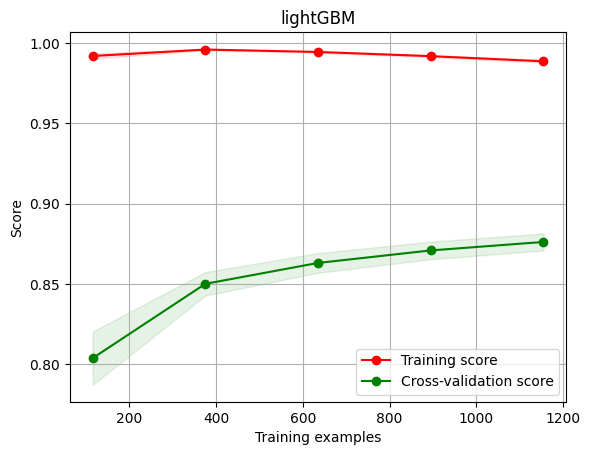

In [34]:
X = X_train
y = y_train
title = "lightGBM"
cv = ShuffleSplit(n_splits=100, test_size=0.5)
model = lgb.LGBMRegressor(learning_rate=0.05, 
                        n_estimators=300,
                        min_child_samples=10,
                        max_depth=5,
                        num_leaves = 25,
                        colsample_bytree =0.8,
                        subsample=0.8,
                        reg_alpha = 0.5,
                        reg_lambda = 0.1 )
plot_learning_curve(model, title, X, y, cv = cv)

In [35]:
model =  lgb.LGBMRegressor(learning_rate=0.05, 
                        n_estimators=100,
                        min_child_samples=10,
                        max_depth=5, 
                        num_leaves = 25,
                        colsample_bytree =0.8,
                        subsample=0.8,
                        reg_alpha = 0.5,
                        reg_lambda = 0.1 )
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./lightGBM_model_predict(pca).txt',y_)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5610
[LightGBM] [Info] Number of data points in the train set: 2790, number of used features: 22
[LightGBM] [Info] Start training from score 0.147570
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

array([ 0.29062203,  0.2910221 ,  0.06404592, ..., -1.91828675,
       -2.04002397, -1.78874395])

In [36]:
model = lgb.LGBMRegressor(learning_rate=0.05, 
                        n_estimators=100,
                        min_child_samples=10,
                        max_depth=5,
                        num_leaves = 25,
                        colsample_bytree =0.8,
                        subsample=0.8,
                        reg_alpha = 0.5,
                        reg_lambda = 0.1 )
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./lightGBM_model_predict(non_pca).txt',y_)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6218
[LightGBM] [Info] Number of data points in the train set: 2888, number of used features: 25
[LightGBM] [Info] Start training from score 0.126353
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

array([ 0.28927125,  0.19342426, -0.11600803, ..., -2.73882861,
       -2.6830782 , -2.64899524])

### Xgboost

In [37]:
model = XGBRFRegressor(n_estimators = 300, 
                       max_depth=15,
                       subsample = 0.8,
                       colsample_bytree = 0.8,
                       learning_rate =1,
                       gamma = 0,
                       reg_lambda= 0 ,# L2 regularizer
                       reg_alpha = 0,verbosity=1)# L1 regularizer
model.fit(X_train_pca, y_train_pca)
score = mean_squared_error(y_valid_pca, model.predict(X_valid_pca))
print("Xgboost score:   ", score)

Xgboost score:    0.13251528356197695


In [41]:
model = XGBRFRegressor(n_estimators = 300, 
                       max_depth=15,
                       subsample = 0.8,
                       colsample_bytree = 0.8,
                       learning_rate =1,
                       gamma = 0,
                       reg_lambda= 0 ,
                       reg_alpha = 0,verbosity=1)
model.fit(X_train, y_train)
score = mean_squared_error(y_valid, model.predict(X_valid))
print("Xgboost score:   ", score)

Xgboost score:    0.14131833540763472


In [39]:
model = XGBRFRegressor(n_estimators = 300, 
                       max_depth=15,
                       subsample = 0.8,
                       colsample_bytree = 0.8,
                       learning_rate =1,
                       gamma = 0,
                       reg_lambda= 0 ,
                       reg_alpha = 0,verbosity=1)
model.fit(train_data_pca,target_data_pca)
y_ = model.predict(test_data_pca)
display(y_)
np.savetxt('./Xgboost_model_predict(pca).txt',y_)

array([ 0.40869606,  0.33833364,  0.10549418, ..., -1.6856022 ,
       -1.7076985 , -1.6487422 ], dtype=float32)

In [40]:
model = XGBRFRegressor(n_estimators = 300, 
                       max_depth=15,
                       subsample = 0.8,
                       colsample_bytree = 0.8,
                       learning_rate =1,
                       gamma = 0,
                       reg_lambda= 0 ,
                       reg_alpha = 0,verbosity=1)
model.fit(train_data.drop('target',axis = 1),train_data['target'])
y_ = model.predict(test_data)
display(y_)
np.savetxt('./Xgboost_model_predict(non_pca).txt',y_)

array([ 0.3587126 ,  0.24491967, -0.01707727, ..., -2.6907082 ,
       -2.7255845 , -2.7579138 ], dtype=float32)